<h1 style="font-family: Cursive; color: purple;"'><center><b>Breast     Cancer   Classification</b></center></h1>

<h2 style='color:blue'>Project Summary</h2>

**The purpose of the analysis:**
The main purposes of finding breast cancer classification using machine learning can be summarized as follows:

**1.) Early Detection:**

* Classify breast cancer at an early stage to improve the chances of successful treatment and reduce mortality rates.

**2.)Accurate Diagnosis:**

* Provide accurate classification between benign and malignant tumors, assisting doctors in making informed decisions.

**3.)Personalized Treatment:**

Aid in personalizing treatment plans based on the classification, leading to better patient outcomes.

**4.)Reduction of Human Error:**

* Minimize errors in diagnosis by using machine learning models to complement or double-check human diagnoses.

**5.) Resource Efficiency:**

* Optimize the use of medical resources by automating the classification process, allowing doctors to focus on more complex cases.

**6.)Scalability:**

* Handle large volumes of medical imaging data efficiently, enabling widespread screening and diagnosis.

**7.)Cost-Effectiveness:**

* Reduce the overall cost of diagnosis and treatment by leveraging machine learning models to automate and streamline processes.

**8.)Data-Driven Insights:**

* Generate insights from patterns and trends in the data, leading to improved understanding and research on breast cancer.

**9.)Improved Patient Outcomes:**

*Contribute to better patient prognosis by enabling quicker, more accurate, and tailored medical interventions.

**10.) Support for Medical Research:**

* Assist in the development of new diagnostic tools and therapies through the analysis of large datasets and identification of novel biomarkers.

<h3>Information of Data</h3>

**About Dataset**

Features are computed from a digitized image of a fine needle aspirate (FNA) of a breast mass. They describe characteristics of the cell nuclei present in the image.
n the 3-dimensional space is that described in: [K. P. Bennett and O. L. Mangasarian: "Robust Linear Programming Discrimination of Two Linearly Inseparable Sets", Optimization Methods and Software 1, 1992, 23-34].

This database is also available through the UW CS ftp server:
ftp ftp.cs.wisc.edu
cd math-prog/cpo-dataset/machine-learn/WDBC/

Also can be found on UCI Machine Learning Repository: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+%28Diagnostic%29

Attribute Information:

1) ID number
2) Diagnosis (M = malignant, B = benign)
3-32)

Ten real-valued features are computed for each cell nucleus:

a) radius (mean of distances from center to points on the perimeter)

b) texture (standard deviation of gray-scale values)

c) perimeter

d) area

e) smoothness (local variation in radius lengths)

f) compactness (perimeter^2 / area - 1.0)

g) concavity (severity of concave portions of the contour)

h) concave points (number of concave portions of the contour)

i) symmetry

j) fractal dimension ("coastline approximation" - 1)

The mean, standard error and "worst" or largest (mean of the three
largest values) of these features were computed for each image,
resulting in 30 features. For instance, field 3 is Mean Radius, field
13 is Radius SE, field 23 is Worst Radius.

All feature values are recoded with four significant digits.

Missing attribute values: none

Class distribution: 357 benign, 212 malignant

<h2 style='color:blue'>Problem Statements</h2>

1.)What is the distribution of radius_mean, area_mean, and texture_mean in breast cancer patients, and how do these features vary across the dataset?

2.)What is the total number of diagnoses in each cancer group (benign vs malignant), and is there a class imbalance in the dataset?

3.)How do the distributions of smoothness_mean, concavity_mean, and concave points_mean differ between benign and malignant cancer groups?

4.)Which feature exhibits the worst variance in breast cancer data, and how can we visualize this variance to better understand outliers or spread within the dataset?

5.)How does the total radius_se differ between each cancer diagnosis group, and what does the distribution look like when visualized as a pie chart?

6.)What are the correlations between different features in the breast cancer dataset, and are there any strongly correlated pairs that could influence model performance?

7.)How do key features interact with each other across different diagnosis groups, and can pair plot visualizations reveal any clusters or separability in the dataset?

### **Importing the necessary libraries**

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform
import joblib
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn import tree
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier

In [2]:
df=pd.read_csv(r'C:\Users\Priya\Desktop\Breast Cancer\data\data.csv')

### **Load Airbnb Dataset**

In [3]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


<h2 style='color:blue'>Data Exploration and Data Cleaning</h2>

In [4]:
df=df.drop(['id','Unnamed: 32'],axis=1)
df.head(2)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.8,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.6,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.9,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.8,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902


In [5]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')

In [6]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


In [7]:
df.shape

(569, 31)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                569 non-null    object 
 1   radius_mean              569 non-null    float64
 2   texture_mean             569 non-null    float64
 3   perimeter_mean           569 non-null    float64
 4   area_mean                569 non-null    float64
 5   smoothness_mean          569 non-null    float64
 6   compactness_mean         569 non-null    float64
 7   concavity_mean           569 non-null    float64
 8   concave points_mean      569 non-null    float64
 9   symmetry_mean            569 non-null    float64
 10  fractal_dimension_mean   569 non-null    float64
 11  radius_se                569 non-null    float64
 12  texture_se               569 non-null    float64
 13  perimeter_se             569 non-null    float64
 14  area_se                  5

In [9]:
df.isnull().sum()

diagnosis                  0
radius_mean                0
texture_mean               0
perimeter_mean             0
area_mean                  0
smoothness_mean            0
compactness_mean           0
concavity_mean             0
concave points_mean        0
symmetry_mean              0
fractal_dimension_mean     0
radius_se                  0
texture_se                 0
perimeter_se               0
area_se                    0
smoothness_se              0
compactness_se             0
concavity_se               0
concave points_se          0
symmetry_se                0
fractal_dimension_se       0
radius_worst               0
texture_worst              0
perimeter_worst            0
area_worst                 0
smoothness_worst           0
compactness_worst          0
concavity_worst            0
concave points_worst       0
symmetry_worst             0
fractal_dimension_worst    0
dtype: int64

In [10]:
df=df.drop_duplicates()
df.count()

diagnosis                  569
radius_mean                569
texture_mean               569
perimeter_mean             569
area_mean                  569
smoothness_mean            569
compactness_mean           569
concavity_mean             569
concave points_mean        569
symmetry_mean              569
fractal_dimension_mean     569
radius_se                  569
texture_se                 569
perimeter_se               569
area_se                    569
smoothness_se              569
compactness_se             569
concavity_se               569
concave points_se          569
symmetry_se                569
fractal_dimension_se       569
radius_worst               569
texture_worst              569
perimeter_worst            569
area_worst                 569
smoothness_worst           569
compactness_worst          569
concavity_worst            569
concave points_worst       569
symmetry_worst             569
fractal_dimension_worst    569
dtype: int64

In [11]:
df.perimeter_mean.nunique()

522

In [12]:
df=df.rename(columns={ 'concave points_mean': 'concave_points_mean','concave points_se':'concave_points_se','concave points_worst':'concave_points_worst'})

In [13]:
df.head(2).T

,0,1
diagnosis,M,M
radius_mean,17.99,20.57
texture_mean,10.38,17.77
perimeter_mean,122.8,132.9
area_mean,1001.0,1326.0
smoothness_mean,0.1184,0.08474
compactness_mean,0.2776,0.07864
concavity_mean,0.3001,0.0869
concave_points_mean,0.1471,0.07017
symmetry_mean,0.2419,0.1812


---


*   **so now first rename few columns for better understanding of variables -**

### Describe the Dataset and removing outliers

In [14]:
df.describe()

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


**Outlier of PERIMETER_WORST**

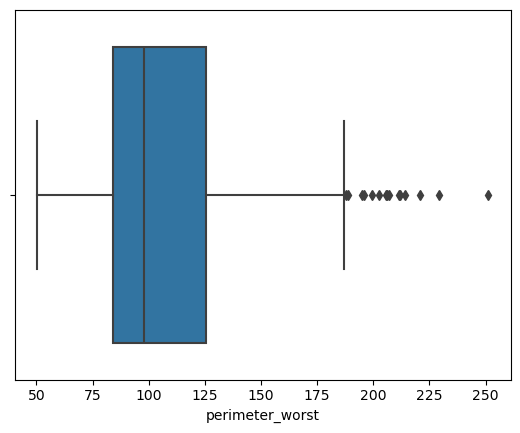

In [15]:
sns.boxplot(x=df['perimeter_worst'])
plt.show()

---

### **using IQR technique**

In [16]:
# writing a outlier function for removing outliers in important columns.
def iqr_technique(DFcolumn):
  Q1 = np.percentile(DFcolumn, 25)
  Q3 = np.percentile(DFcolumn, 75)
  IQR = Q3 - Q1
  lower_range = Q1 - (1.5 * IQR)
  upper_range = Q3 + (1.5 * IQR)                        # interquantile range

  return lower_range,upper_range

In [17]:
lower_bound,upper_bound = iqr_technique(df['perimeter_worst'])

df = df[(df.perimeter_worst>lower_bound) & (df.perimeter_worst<upper_bound)]
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,...,24.990,23.41,158.80,1956.0,0.12380,0.18660,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,...,22.540,16.67,152.20,1575.0,0.13740,0.20500,0.4000,0.1625,0.2364,0.07678
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,M,21.56,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.13890,0.1726,...,25.450,26.40,166.10,2027.0,0.14100,0.21130,0.4107,0.2216,0.2060,0.07115
565,M,20.13,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.09791,0.1752,...,23.690,38.25,155.00,1731.0,0.11660,0.19220,0.3215,0.1628,0.2572,0.06637
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820
567,M,20.60,29.33,140.10,1265.0,0.11780,0.27700,0.35140,0.15200,0.2397,...,25.740,39.42,184.60,1821.0,0.16500,0.86810,0.9387,0.2650,0.4087,0.12400


**After removing outliers of perimeter_worst**

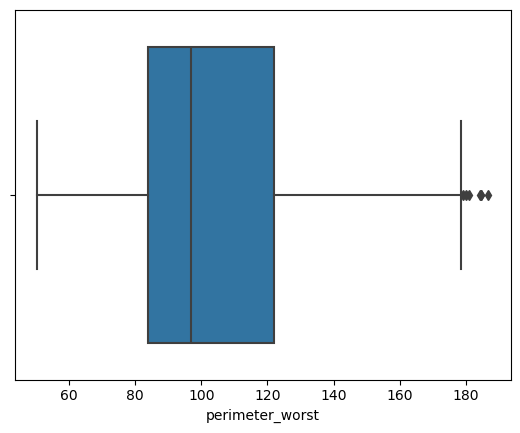

In [18]:
sns.boxplot(x=df['perimeter_worst'])
plt.show()

**Outlier of 'AREA_MEAN'**

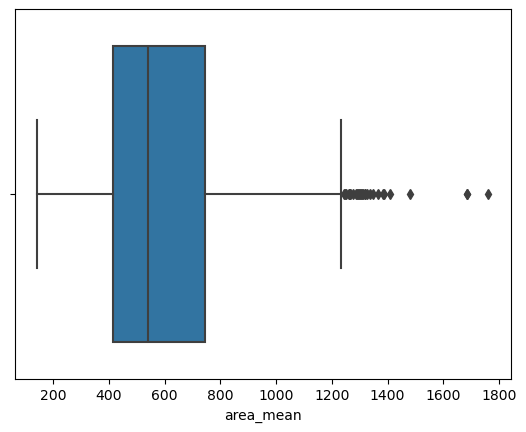

In [19]:
sns.boxplot(x=df['area_mean'])
plt.show()

In [20]:
lower_bound,upper_bound = iqr_technique(df['area_mean'])

df = df[(df.area_mean>lower_bound) & (df.area_mean<upper_bound)]
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,...,25.380,17.33,184.60,2019.0,0.16220,0.66560,0.7119,0.2654,0.4601,0.11890
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,...,23.570,25.53,152.50,1709.0,0.14440,0.42450,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
5,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.5355,0.1741,0.3985,0.12440
6,M,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,...,22.880,27.66,153.20,1606.0,0.14420,0.25760,0.3784,0.1932,0.3063,0.08368
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
560,B,14.05,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,...,15.300,33.17,100.20,706.7,0.12410,0.22640,0.1326,0.1048,0.2250,0.08321
561,B,11.20,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.00000,0.1060,...,11.920,38.30,75.19,439.6,0.09267,0.05494,0.0000,0.0000,0.1566,0.05905
562,M,15.22,30.62,103.40,716.9,0.10480,0.20870,0.25500,0.09429,0.2128,...,17.520,42.79,128.70,915.0,0.14170,0.79170,1.1700,0.2356,0.4089,0.14090
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820


**After removing outliers of area_mean**

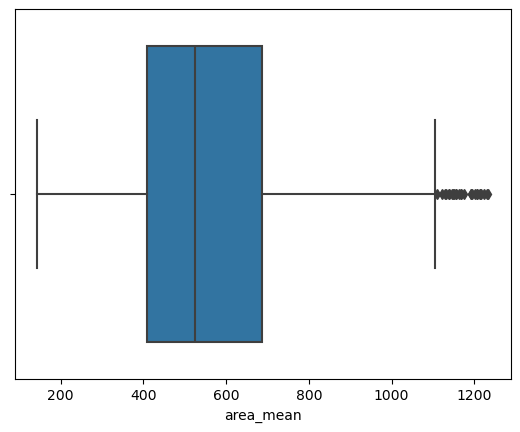

In [21]:
sns.boxplot(x=df['area_mean'])
plt.show()

**Outlier of 'AREA_WORST'**

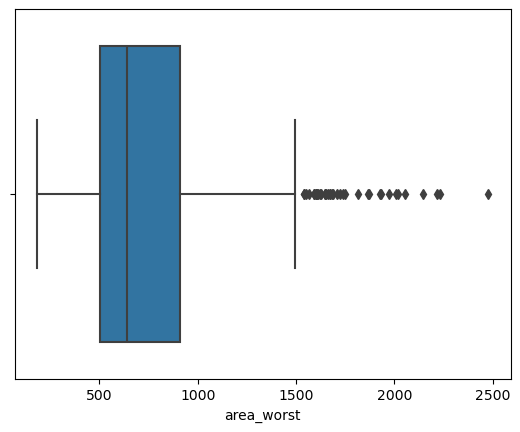

In [22]:
sns.boxplot(x=df['area_worst'])
plt.show()

In [23]:
lower_bound,upper_bound = iqr_technique(df['area_worst'])

df = df[(df.area_worst>lower_bound) & (df.area_worst<upper_bound)]
df

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,...,14.910,26.50,98.87,567.7,0.20980,0.86630,0.6869,0.2575,0.6638,0.17300
5,M,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,...,15.470,23.75,103.40,741.6,0.17910,0.52490,0.5355,0.1741,0.3985,0.12440
7,M,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,...,17.060,28.14,110.60,897.0,0.16540,0.36820,0.2678,0.1556,0.3196,0.11510
8,M,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,...,15.490,30.73,106.20,739.3,0.17030,0.54010,0.5390,0.2060,0.4378,0.10720
9,M,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,...,15.090,40.68,97.65,711.4,0.18530,1.05800,1.1050,0.2210,0.4366,0.20750
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
560,B,14.05,27.15,91.38,600.4,0.09929,0.11260,0.04462,0.04304,0.1537,...,15.300,33.17,100.20,706.7,0.12410,0.22640,0.1326,0.1048,0.2250,0.08321
561,B,11.20,29.37,70.67,386.0,0.07449,0.03558,0.00000,0.00000,0.1060,...,11.920,38.30,75.19,439.6,0.09267,0.05494,0.0000,0.0000,0.1566,0.05905
562,M,15.22,30.62,103.40,716.9,0.10480,0.20870,0.25500,0.09429,0.2128,...,17.520,42.79,128.70,915.0,0.14170,0.79170,1.1700,0.2356,0.4089,0.14090
566,M,16.60,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.05302,0.1590,...,18.980,34.12,126.70,1124.0,0.11390,0.30940,0.3403,0.1418,0.2218,0.07820


**After removing outliers of area_worst**

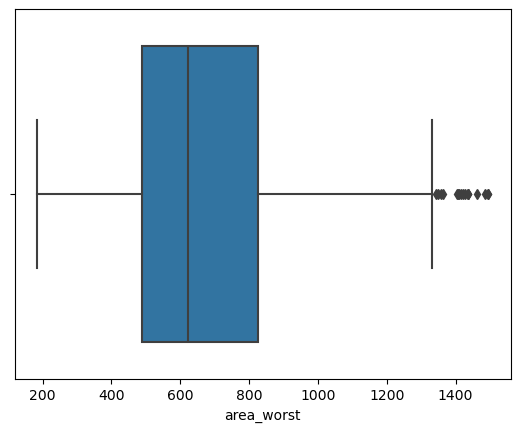

In [24]:
sns.boxplot(x=df['area_worst'])
plt.show()

<h2 style='color:blue'>Data Visualization</h2>

**(1)Destribution of radius mean,area_mean and texture_mean of breast cancer using histrogram**

Text(0.5, 1.0, 'Distribution of radius mean')

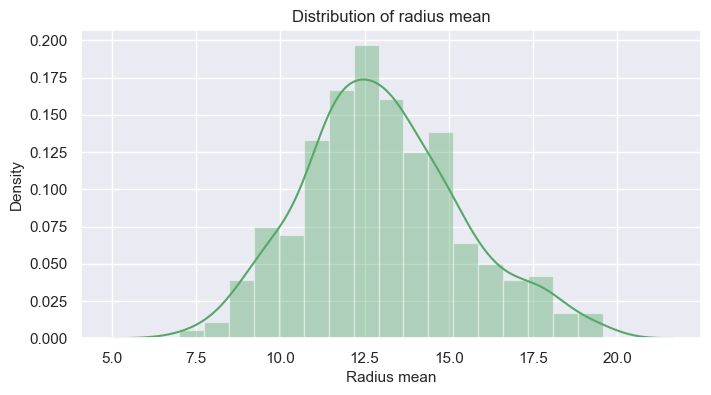

In [32]:
plt.figure(figsize=(8,4))
sns.set_theme(style='darkgrid')
sns.distplot(x=df['radius_mean'],color='g')
plt.xlabel('Radius mean', fontsize=11)
plt.ylabel('Density', fontsize=11)
plt.title('Distribution of radius mean',fontsize=12)

**observations -->**

*   The range of  radius mean on breast cancer being starts from **7 to 19.5 ** , with the majority of high radius mean range from **10.5 to 15.5**

*   The histogram's peak in the **10.5 to 15.5 range** indicates that this is where most tumor sizes are found. The frequency decreases as you move away from this peak.


<Axes: ylabel='Density'>

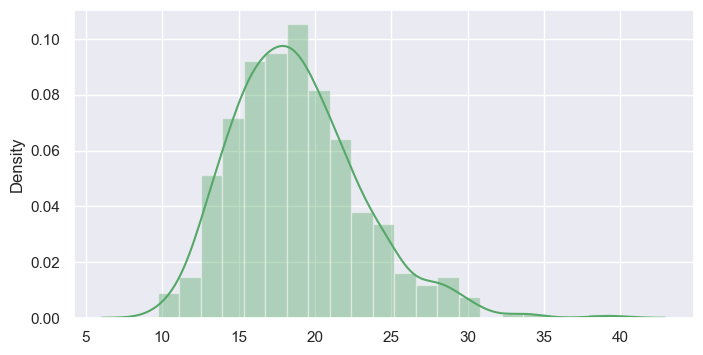

In [28]:
plt.figure(figsize=(8,4))
sns.set_theme(style='darkgrid')
sns.distplot(x=df['texture_mean'],color='g')


**observations -->**

*   Mean texture ranges from **10 to 31**, with a concentration between **14 to 22**. 
*   Peak in the  **15 to 21 range**  suggests this is the most common texture range.

<Axes: ylabel='Density'>

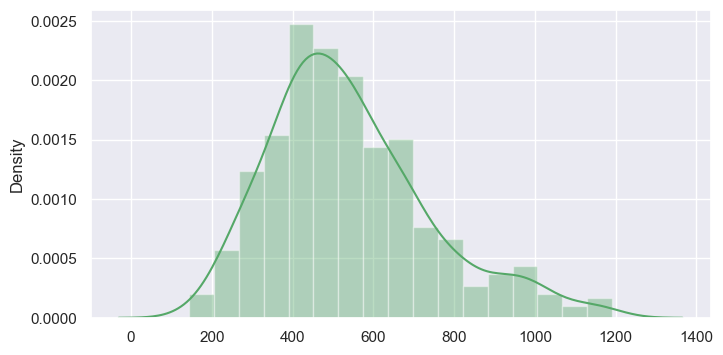

In [29]:
plt.figure(figsize=(8,4))
sns.set_theme(style='darkgrid')
sns.distplot(x=df['area_mean'],color='g')


**observations -->**
* Mean area ranges from **150 to 1190** relatively small values to larger ones, reflecting the variability in tumor sizes.
* Most tumors might have mean areas concentrated within a certain range, with fewer tumors having very large areas range **400 to 500**.

---


   **(2) Total no of diagnosis in each cancer group using Count plot**

In [33]:
counts=df.diagnosis.value_counts().reset_index()
counts.columns=['Diagnosis','Total_Count']
counts

,Diagnosis,Total_Count
0,B,357
1,M,129


Text(0.5, 1.0, 'Total no of Diagnosis using count plot')

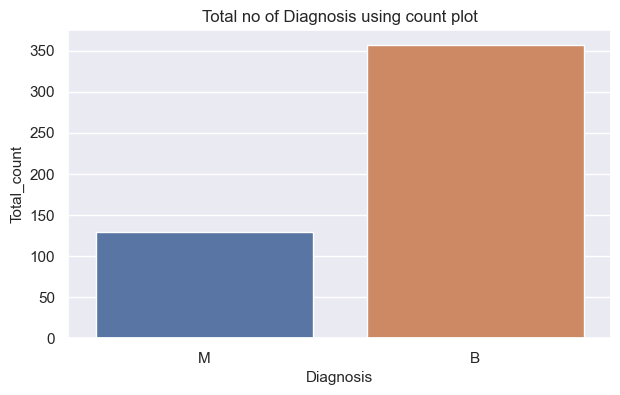

In [39]:
plt.figure(figsize=(7,4))
sns.countplot(x=df['diagnosis'])
plt.xlabel('Diagnosis',fontsize=11)
plt.ylabel('Total_count',fontsize=11)
plt.title('Total no of Diagnosis using count plot',fontsize=12)

**Observations -->**

*   M and B diagnosis have more difference to each other.

* **357** benign (B) cases and **129** malignant (M) cases.

*   Benign cases significantly outnumber malignant cases.Total number of samples is 486.

*   The plot clearly shows that benign cases dominate. The imbalance might indicate real-world distribution or data collection bias.
   
*    Imbalance might affect the model's ability to generalize well to malignant cases.

---

**(3) Smoothness,concavity,concave points distribution Of each diagnosis Group using Violin Plot**

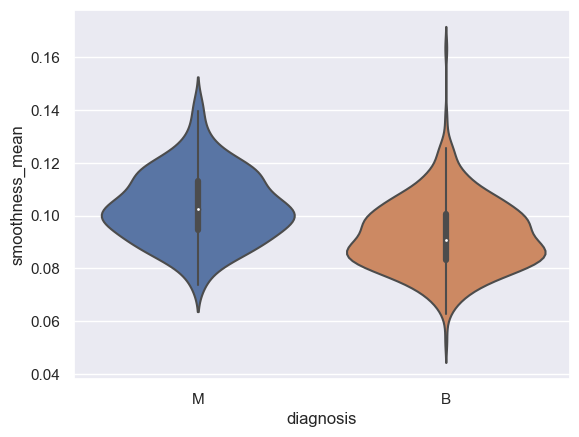

In [42]:
ax=sns.violinplot(x=df.diagnosis,y=df.smoothness_mean)

**Observations -->**

*  The distribution of feature values for benign diagnoses is notably high. 
*   Both malignant and benign diagnoses show significant similarity in the diversity of smoothness_mean values, you can see in violin plot.

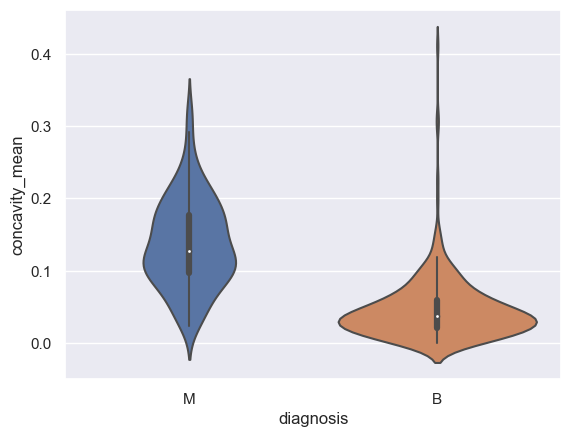

In [43]:
ax=sns.violinplot(x=df.diagnosis,y=df.concavity_mean)

**Observations -->**

* The distribution of feature values for benign diagnoses is very high and shows greater diversity compared to malignant diagnoses.
* Malignant diagnoses show greater diversity in concavity_mean, as observed in the violin plot.

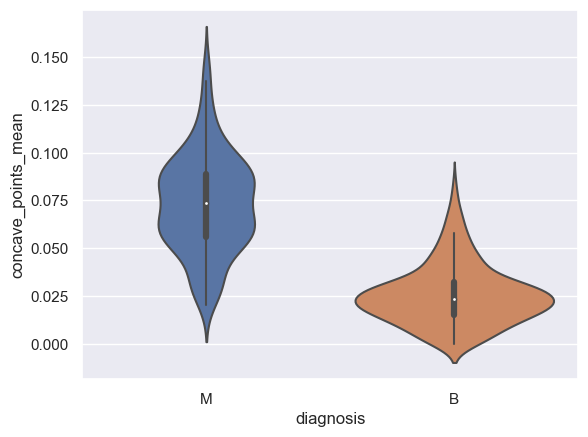

In [44]:
ax=sns.violinplot(x=df.diagnosis,y=df.concave_points_mean)

**Observations -->**

*    The distribution of feature values for malignant diagnoses is very high.
*     Benign diagnoses show greater diversity in the concave points_mean range compared to malignant diagnoses, as seen in the violin plot.



---
**(4)Worst variance in Breast Cancer using Scatter plot**

<Axes: xlabel='radius_worst', ylabel='texture_worst'>

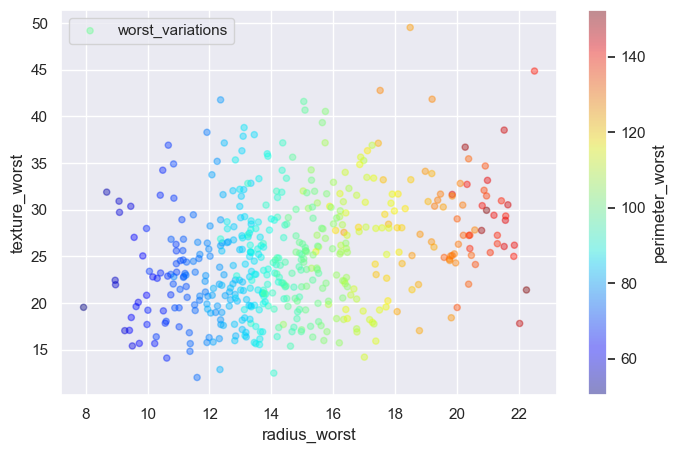

In [69]:
fig = df.plot.scatter(x="radius_worst", y="texture_worst",label='worst_variations' ,c="perimeter_worst",cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(8,5))
fig

**Observations -->**

*   The color gradient (from blue to red, as per the 'jet' colormap) indicates the variation in perimeter_worst. Darker colors (blues) represent lower values, while lighter colors (reds) represent higher values.
*   The scatter plot shows a relationship between radius_worst and texture_worst. Generally, as radius_worst increases, texture_worst might also increase, though this relationship could vary based on the spread of points.

*  Points with higher perimeter_worst values (indicated by the color) tend to appear in certain regions of the plot. This might suggest that larger perimeter tumors also have higher radius_worst and texture_worst values, which could be indicative of more aggressive or advanced tumors.



---





---
**(5) Total radius_se by Each cancer group using Pie Chart**

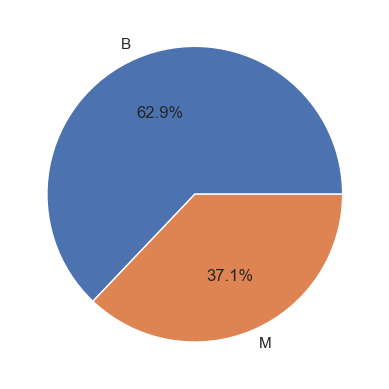

In [63]:
radius_se_diagnosis_group = df.groupby("diagnosis")["radius_se"].sum()

# Create a pie chart
plt.pie(radius_se_diagnosis_group, labels=radius_se_diagnosis_group.index, autopct='%1.1f%%')
plt.title("", fontsize='15')

# Display the chart
plt.show()


**Observations -->**

*  Benign (B): Holds the largest share of total radius_se at 62.9%, indicating higher variability in radius measurements among benign cases.
*  Malignant (M): Contributes 37.1% to the total radius_se, showing less variability compared to benign cases.
*  The bar chart highlights a significant difference in the standard error of the radius between the two diagnoses, with benign cases having more variability.
*  Implication: The higher radius_se in benign tumors could suggest a wider range of tumor sizes or shapes within this group.



---
**(6) Correlation Heatmap Visualization**




In [70]:
print(df.dtypes)

diagnosis                   object
radius_mean                float64
texture_mean               float64
perimeter_mean             float64
area_mean                  float64
smoothness_mean            float64
compactness_mean           float64
concavity_mean             float64
concave_points_mean        float64
symmetry_mean              float64
fractal_dimension_mean     float64
radius_se                  float64
texture_se                 float64
perimeter_se               float64
area_se                    float64
smoothness_se              float64
compactness_se             float64
concavity_se               float64
concave_points_se          float64
symmetry_se                float64
fractal_dimension_se       float64
radius_worst               float64
texture_worst              float64
perimeter_worst            float64
area_worst                 float64
smoothness_worst           float64
compactness_worst          float64
concavity_worst            float64
concave_points_worst

In [71]:
import copy

In [72]:
df1=copy.deepcopy(df)

In [73]:
df1.head(2)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,M,12.45,15.70,82.57,477.1,0.1278,0.1700,0.1578,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


In [74]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 486 entries, 3 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                486 non-null    object 
 1   radius_mean              486 non-null    float64
 2   texture_mean             486 non-null    float64
 3   perimeter_mean           486 non-null    float64
 4   area_mean                486 non-null    float64
 5   smoothness_mean          486 non-null    float64
 6   compactness_mean         486 non-null    float64
 7   concavity_mean           486 non-null    float64
 8   concave_points_mean      486 non-null    float64
 9   symmetry_mean            486 non-null    float64
 10  fractal_dimension_mean   486 non-null    float64
 11  radius_se                486 non-null    float64
 12  texture_se               486 non-null    float64
 13  perimeter_se             486 non-null    float64
 14  area_se                  486 no

In [75]:
df1=df1.drop(['diagnosis'],axis=1)

In [80]:
df1.head(2)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,12.45,15.70,82.57,477.1,0.1278,0.1700,0.1578,0.08089,0.2087,0.07613,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


In [81]:
df.head(2)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,M,12.45,15.70,82.57,477.1,0.1278,0.1700,0.1578,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


In [87]:
corr=df1.corr()
corr

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
radius_mean,1.000000,0.224436,0.996099,0.992464,0.043908,0.332240,0.454981,0.660427,0.023564,-0.360240,...,0.961712,0.213255,0.950187,0.947597,0.011182,0.297455,0.367442,0.600117,0.102764,-0.051244
texture_mean,0.224436,1.000000,0.233900,0.235671,-0.063072,0.159189,0.228700,0.201323,0.035229,-0.047432,...,0.261093,0.910101,0.270058,0.267891,0.043670,0.213688,0.227783,0.206717,0.077076,0.103139
perimeter_mean,0.996099,0.233900,1.000000,0.989555,0.094408,0.408968,0.520386,0.712984,0.070145,-0.291587,...,0.964687,0.225071,0.962574,0.951517,0.057348,0.361618,0.425862,0.649587,0.137498,0.013913
area_mean,0.992464,0.235671,0.989555,1.000000,0.043273,0.331102,0.468524,0.668609,0.033360,-0.343083,...,0.958047,0.217476,0.946289,0.957856,0.016281,0.283728,0.365289,0.590845,0.096501,-0.051008
smoothness_mean,0.043908,-0.063072,0.094408,0.043273,1.000000,0.650650,0.478961,0.573284,0.537123,0.612156,...,0.127185,0.012571,0.161955,0.126198,0.814883,0.450998,0.381567,0.493059,0.385911,0.507764
compactness_mean,0.332240,0.159189,0.408968,0.331102,0.650650,1.000000,0.869548,0.824498,0.565576,0.667403,...,0.403541,0.196957,0.484574,0.397332,0.580531,0.857172,0.784052,0.794557,0.485219,0.747378
concavity_mean,0.454981,0.228700,0.520386,0.468524,0.478961,0.869548,1.000000,0.876472,0.469687,0.484996,...,0.514819,0.257545,0.582555,0.522737,0.457241,0.772181,0.887584,0.828859,0.411735,0.626691
concave_points_mean,0.660427,0.201323,0.712984,0.668609,0.573284,0.824498,0.876472,1.000000,0.454181,0.309787,...,0.716832,0.233142,0.761506,0.719747,0.500483,0.675926,0.714303,0.896368,0.387543,0.468868
symmetry_mean,0.023564,0.035229,0.070145,0.033360,0.537123,0.565576,0.469687,0.454181,1.000000,0.491838,...,0.101441,0.063132,0.144164,0.108886,0.429090,0.434973,0.383392,0.403056,0.677835,0.434576
fractal_dimension_mean,-0.360240,-0.047432,-0.291587,-0.343083,0.612156,0.667403,0.484996,0.309787,0.491838,1.000000,...,-0.273528,-0.016448,-0.204606,-0.258264,0.538010,0.520646,0.427070,0.284422,0.342657,0.789947


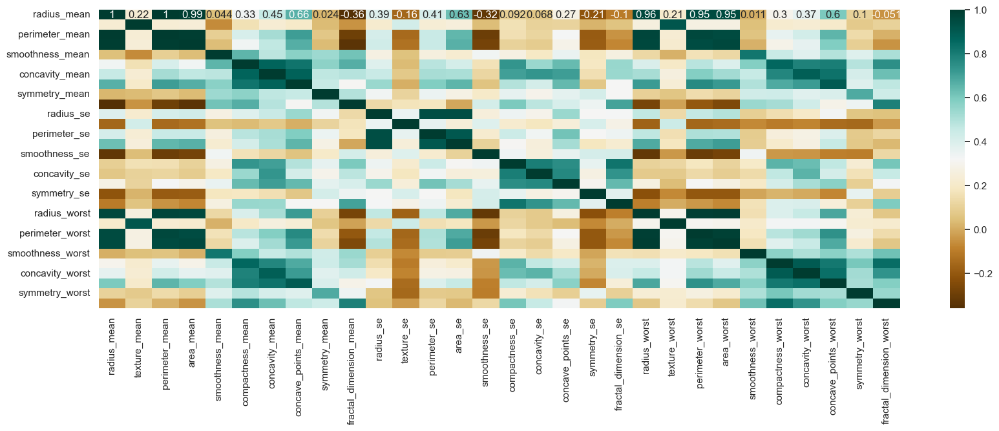

In [91]:
plt.figure(figsize=(20,6))
sns.heatmap(corr, cmap='BrBG',annot=True)
plt.show()

**Observations -->**

* Features related to size, such as radius, perimeter, and area, often show strong positive correlations with each other.
* Some features might not correlate strongly with others, indicating that they capture different aspects of the tumor's characteristics.

---

**(7) Pair Plot Visualization**

In [92]:
sns.pairplot(df)
plt.show()

**Observations -->**

* **Cluster Formation:** Malignant and benign tumors might form distinct clusters in certain feature combinations, indicating that these features are good discriminators.
* **Feature Relationships:** Strong linear relationships between features like radius_mean and perimeter_mean can be visually confirmed.
* **Distribution Differences:** The histograms on the diagonal can reveal how differently the features are distributed for benign and malignant tumors.
* **Overlaps:** In some feature combinations, there might be overlaps between benign and malignant cases, indicating areas where classification might be more challenging.

<h2 style='color:blue'>Modeling & Accuracy Check</h2>

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 486 entries, 3 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   diagnosis                486 non-null    object 
 1   radius_mean              486 non-null    float64
 2   texture_mean             486 non-null    float64
 3   perimeter_mean           486 non-null    float64
 4   area_mean                486 non-null    float64
 5   smoothness_mean          486 non-null    float64
 6   compactness_mean         486 non-null    float64
 7   concavity_mean           486 non-null    float64
 8   concave_points_mean      486 non-null    float64
 9   symmetry_mean            486 non-null    float64
 10  fractal_dimension_mean   486 non-null    float64
 11  radius_se                486 non-null    float64
 12  texture_se               486 non-null    float64
 13  perimeter_se             486 non-null    float64
 14  area_se                  486 no

In [27]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.24140,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,M,12.45,15.70,82.57,477.1,0.1278,0.1700,0.15780,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244
7,M,13.71,20.83,90.20,577.9,0.1189,0.1645,0.09366,0.05985,0.2196,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.1151
8,M,13.00,21.82,87.50,519.8,0.1273,0.1932,0.18590,0.09353,0.2350,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.1072
9,M,12.46,24.04,83.97,475.9,0.1186,0.2396,0.22730,0.08543,0.2030,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.2075


In [28]:
x=df.drop('diagnosis',axis=1)
x.head(2)

,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,fractal_dimension_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,12.45,15.70,82.57,477.1,0.1278,0.1700,0.1578,0.08089,0.2087,0.07613,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


In [29]:
y=df.diagnosis
y.head()

3    M
5    M
7    M
8    M
9    M
Name: diagnosis, dtype: object

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [53]:
model=LogisticRegression()
model.fit(X_train,y_train)

LogisticRegression()

In [54]:
model.score(X_test,y_test)

0.9383561643835616

In [55]:
y_truth=y_test
y_predicted=model.predict(X_test)

<h3>Confusion Matrix of LogisticRegression</h3>

In [56]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

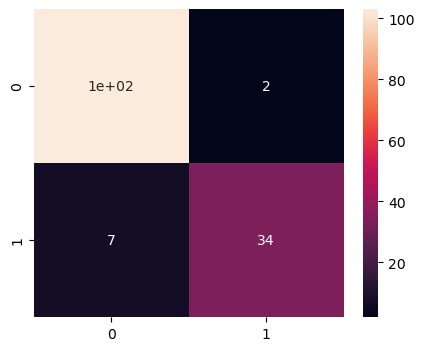

In [60]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

In [61]:
model=svm.SVC()
model.fit(X_train,y_train)

SVC()

In [62]:
model.score(X_test,y_test)

0.8904109589041096

In [63]:
y_truth=y_test
y_predicted=model.predict(X_test)

<h3>Confusion Matrix of SVC</h3>

In [64]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

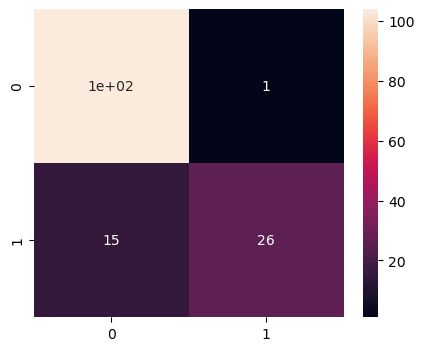

In [65]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

In [68]:
model=DecisionTreeClassifier()
model.fit(X_train,y_train)

DecisionTreeClassifier()

In [69]:
model.score(X_test,y_test)

0.9178082191780822

In [70]:
y_truth=y_test
y_predicted=model.predict(X_test)

<h3>Confusion Matrix of DecisionTreeClassifier</h3>

In [71]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

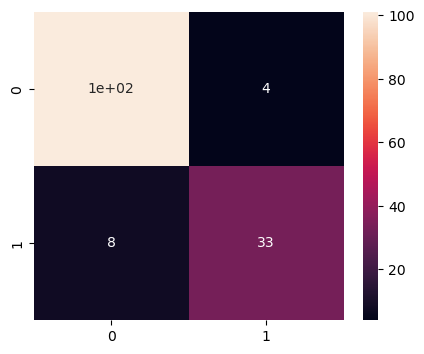

In [72]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

In [73]:
model=RandomForestClassifier()
model.fit(X_train,y_train)

RandomForestClassifier()

In [74]:
model.score(X_test,y_test)

0.958904109589041

In [75]:
y_truth=y_test
y_predicted=model.predict(X_test)

<h3>Confusion Matrix of RandomForestClassifier</h3>

In [76]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

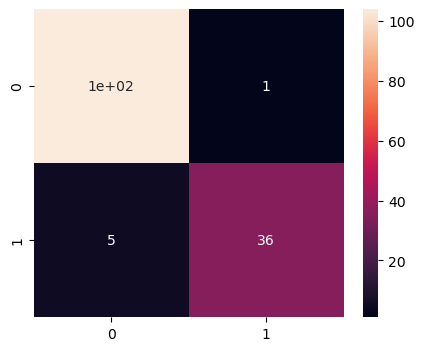

In [77]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

In [78]:
base_model = DecisionTreeClassifier()

# Create a Bagging Classifier using the Decision Tree
bagging_model = BaggingClassifier(base_estimator=base_model, n_estimators=100, random_state=42)

# Train the model
bagging_model.fit(X_train, y_train)


BaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=100,
                  random_state=42)

In [79]:
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=.2)

In [81]:
# Make predictions
y_predicted = bagging_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy of Bagging Classifier: {accuracy:.2f}')

Accuracy of Bagging Classifier: 0.94


In [82]:
y_truth=y_test

<h3>Confusion Matrix of 
BaggingClassifier</h3>

In [83]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

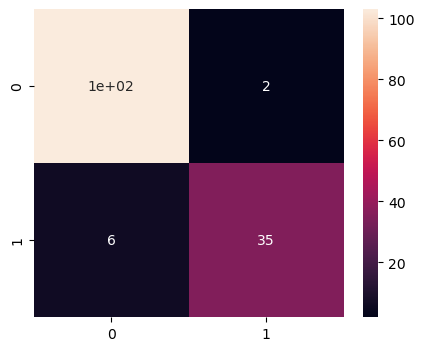

In [84]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

In [85]:
# Create a base decision tree classifier
base_model = DecisionTreeClassifier(max_depth=1)  # Weak learner

# Create an AdaBoost Classifier
adaboost_model = AdaBoostClassifier(base_estimator=base_model, n_estimators=50, random_state=42)

# Train the model
adaboost_model.fit(X_train, y_train)

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1),
                   random_state=42)

In [90]:
# Make predictions
y_predicted = adaboost_model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy of AdaBoost Classifier: {accuracy:.2f}')

Accuracy of AdaBoost Classifier: 0.94


In [91]:
y_truth=y_test

<h3>Confusion Matrix of AdaBoostClassifier</h3>

In [92]:
cm=confusion_matrix(y_truth,y_predicted)

<Axes: >

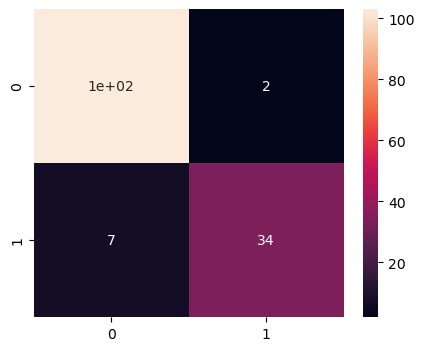

In [93]:
plt.figure(figsize=(5,4))
seaborn.heatmap(cm,annot=True)

<h2 style='color:blue'>Hyperparameter tunning</h2>

In [110]:
models={
    'svm':{
        'model':svm.SVC(gamma='auto'),
        'params':{
            'C':[1,10,20],
            'kernel':['rbf','linear']
        }
    },
    'RF':{
    'model':RandomForestClassifier(),
        'params': {
            'n_estimators': randint(10,100),
            'max_depth': [None, 10, 20],
            'min_samples_split': randint(2, 11),
            'min_samples_leaf': randint(1, 5)
        }
    },
    'logistic_regression':{
        'model':LogisticRegression(),
        'params':{
            'C':[1,5,10]
        }
    }
}

In [111]:
scores=[]
for model_name in models:
    mp=models[model_name]
    gds=RandomizedSearchCV(mp['model'],mp['params'],cv=2,return_train_score=True)
    gds.fit(xtrain,ytrain)
    scores.append({'model':model_name,'best_score':gds.best_score_,
                  'best_params':gds.best_params_})

In [112]:
newmodel=pd.DataFrame(scores,columns=['model','best_params','best_score'])

In [113]:
df1=newmodel.to_excel('new_model.xlsx')

In [114]:
df1

In [115]:
newmodel

,model,best_params,best_score
0,svm,"{'kernel': 'linear', 'C': 1}",0.956186
1,RF,"{'max_depth': None, 'min_samples_leaf': 3, 'mi...",0.948454
2,logistic_regression,{'C': 10},0.945876


In [122]:
model=svm.SVC(kernel='linear',C= 1)

In [124]:
df.head(2)

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave_points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave_points_worst,symmetry_worst,fractal_dimension_worst
3,M,11.42,20.38,77.58,386.1,0.1425,0.2839,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.1730
5,M,12.45,15.70,82.57,477.1,0.1278,0.1700,0.1578,0.08089,0.2087,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.1244


<h2 style='color:blue'>Packaging</h2>

In [126]:
numeric_features = x.select_dtypes(include=['number']).columns.tolist()

In [127]:
# Preprocessing for numerical features
numeric_transformer = StandardScaler()
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features),
    ])

In [128]:
model_pipeline=Pipeline(steps=[
    ('preprocessor',preprocessor),
    ('model',svm.SVC(kernel='linear',C= 1))
])

In [129]:
model_pipeline.fit(X_train,y_train)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['radius_mean',
                                                   'texture_mean',
                                                   'perimeter_mean',
                                                   'area_mean',
                                                   'smoothness_mean',
                                                   'compactness_mean',
                                                   'concavity_mean',
                                                   'concave_points_mean',
                                                   'symmetry_mean',
                                                   'fractal_dimension_mean',
                                                   'radius_se', 'texture_se',
                                                   'perimeter_se', 'area_se',
                                                   'smoothness_se',
                                                   'compactness_se',
                                                   'concavity_se',
                                                   'concave_points_se',
                                                   'symmetry_se',
                                                   'fractal_dimension_se',
                                                   'radius_worst',
                                                   'texture_worst',
                                                   'perimeter_worst',
                                                   'area_worst',
                                                   'smoothness_worst',
                                                   'compactness_worst',
                                                   'concavity_worst',
                                                   'concave_points_worst',
                                                   'symmetry_worst',
                                                   'fractal_dimension_worst'])])),
                ('model', SVC(C=1, kernel='linear'))])

In [130]:
joblib.dump(model_pipeline,'model_pipeline.joblib')

['model_pipeline.joblib']

In [131]:
loaded_pipeline=joblib.load('model_pipeline.joblib')

In [132]:
print(type(loaded_pipeline))

<class 'sklearn.pipeline.Pipeline'>


In [134]:
print(loaded_pipeline.named_steps.keys())

dict_keys(['preprocessor', 'model'])


In [135]:
df.columns

Index(['diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave_points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave_points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave_points_worst',
       'symmetry_worst', 'fractal_dimension_worst'],
      dtype='object')